## The US Major Cities' Produce Retail Prices

In [1]:
# importing the libraries
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

import warnings 
warnings.filterwarnings("ignore")

In [9]:
# Reading the dataset

url_data_set = 'https://drive.google.com/file/d/1onDtRGMkb2N6W9ZJeRgw3gWXE44OgwZg/view?usp=sharing'
url_data_set_2 = 'https://drive.google.com/uc?id=' + url_data_set.split('/')[-2]
dataset = pd.read_csv(url_data_set_2, parse_dates=["date"], date_format="%Y-%m-%d")
dataset.head(5)

,productname,date,farmprice,atlantaretail,chicagoretail,losangelesretail,newyorkretail,averagespread
0,Strawberries,2019-05-19,$1.16,$2.23,$1.70,$1.99,$2.54,82.33%
1,Romaine Lettuce,2019-05-19,$0.35,$1.72,$2.00,$1.69,$1.99,428.57%
2,Red Leaf Lettuce,2019-05-19,$0.32,$1.84,$1.84,$1.69,$1.89,467.19%
3,Potatoes,2019-05-19,$1.50,$5.32,$5.14,$3.99,$6.22,244.50%
4,Oranges,2019-05-19,$0.41,$1.42,$1.45,$1.34,$2.05,281.71%


-Product Name: Identifies the name of the produce item

-Date: Specifies the pricing information date

-Farm Price: Reflects the selling price of the produce on the farm

-Retail Prices: Indicates retail prices in the major US cities (Atlanta, Chicago, Los Angeles, New York)

-Average Spread: Represents the percentage denoting the average markup between farm and retail prices prices.

In [13]:
# Checking the shape of the dataset
dataset.shape

(15766, 8)

In [14]:
# Looking at the dataset overall info
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15766 entries, 0 to 15765
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   productname       15766 non-null  object        
 1   date              15766 non-null  datetime64[ns]
 2   farmprice         15766 non-null  object        
 3   atlantaretail     15766 non-null  object        
 4   chicagoretail     15766 non-null  object        
 5   losangelesretail  15766 non-null  object        
 6   newyorkretail     15766 non-null  object        
 7   averagespread     15766 non-null  object        
dtypes: datetime64[ns](1), object(7)
memory usage: 985.5+ KB


In [17]:
# checking if there are any null values in the dataset
dataset.isnull().sum()

productname         0
date                0
farmprice           0
atlantaretail       0
chicagoretail       0
losangelesretail    0
newyorkretail       0
averagespread       0
dtype: int64

In [18]:
# checking if there are any duplicate values in the dataset
dataset.duplicated().sum()

51

In [23]:
#There are 51 duplicate values in the dataset, we're removing them:
dataset.drop_duplicates(inplace=True)

## Data Cleaning

In [20]:
dataset["farmprice"] = dataset["farmprice"].str.replace('$', '')
dataset["atlantaretail"] = dataset["atlantaretail"].str.replace('$', '')
dataset["chicagoretail"] = dataset["chicagoretail"].str.replace('$', '')
dataset["losangelesretail"] = dataset["losangelesretail"].str.replace('$', '')
dataset["newyorkretail"] = dataset["newyorkretail"].str.replace('$', '')
dataset["averagespread"] = dataset["averagespread"].str.replace('$', '')
dataset["averagespread"] = dataset["averagespread"].str.replace('%', '')

In [21]:
# converting coulumns into numeric datatype
columns=dataset.drop(["productname","date"], axis=1).columns.tolist()
for col in columns:
    dataset[col] = pd.to_numeric(dataset[col],errors='coerce')

## Visualization of Correlation Matrix

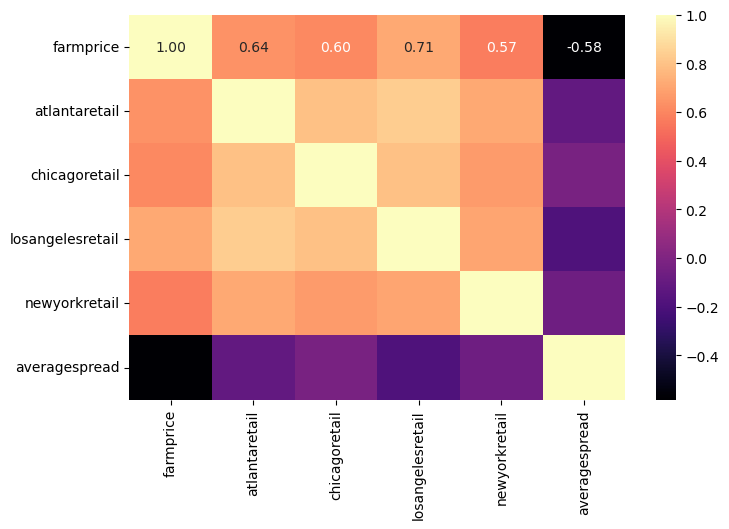

In [48]:
df= dataset.drop(["productname","date"], axis=1)
plt.figure(figsize=(8,5))
sns.heatmap(df.corr(), annot=True,fmt=".2f", cmap="magma")
plt.show()

#Here we notice that Losangeles and Atlanta have a correlation of 0.84, which hints they sell their products at similar prices. 

## Exploratory Data Analysis

In [24]:
# checking unique Product names
dataset["productname"].unique()

array(['Strawberries', 'Romaine Lettuce', 'Red Leaf Lettuce', 'Potatoes',
       'Oranges', 'Iceberg Lettuce', 'Green Leaf Lettuce', 'Celery',
       'Cauliflower', 'Carrots', 'Cantaloupe', 'Broccoli Crowns',
       'Avocados', 'Broccoli Bunches', 'Asparagus', 'Flame Grapes',
       'Thompson Grapes', 'Honeydews', 'Tomatoes', 'Plums', 'Peaches',
       'Nectarines'], dtype=object)

In [25]:
dataset["productname"].nunique()
# there are 22 unique products

22

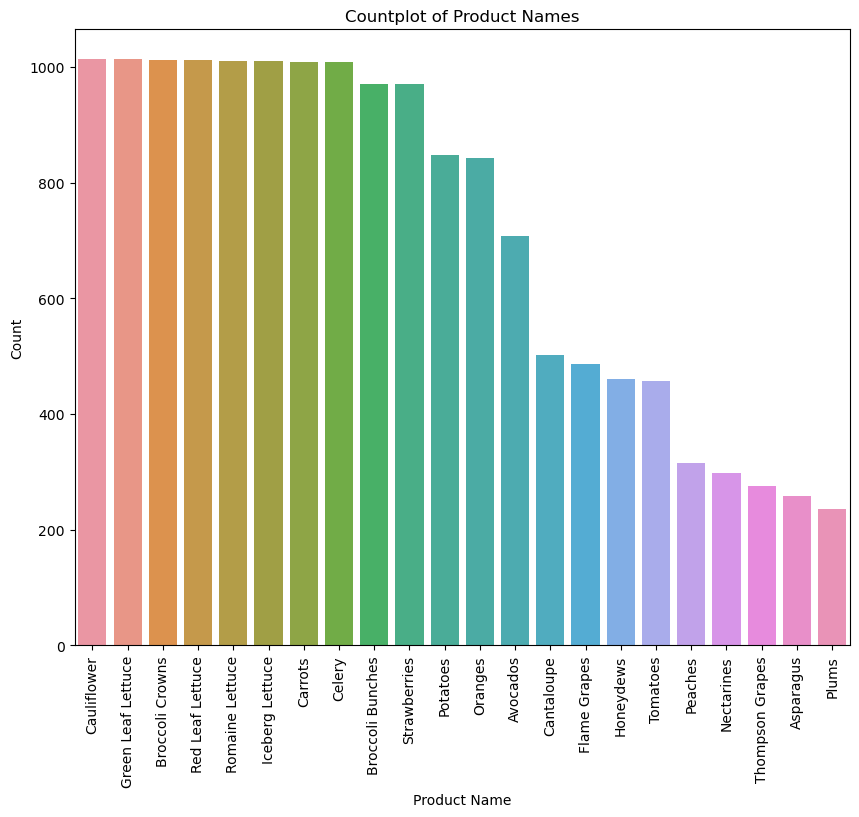

In [26]:
plt.figure(figsize=(10, 8))
sns.countplot(data=dataset, x='productname', order=dataset['productname'].value_counts().index)
plt.xticks(rotation=90)
plt.title("Countplot of Product Names")
plt.xlabel("Product Name")
plt.ylabel("Count")
plt.show()

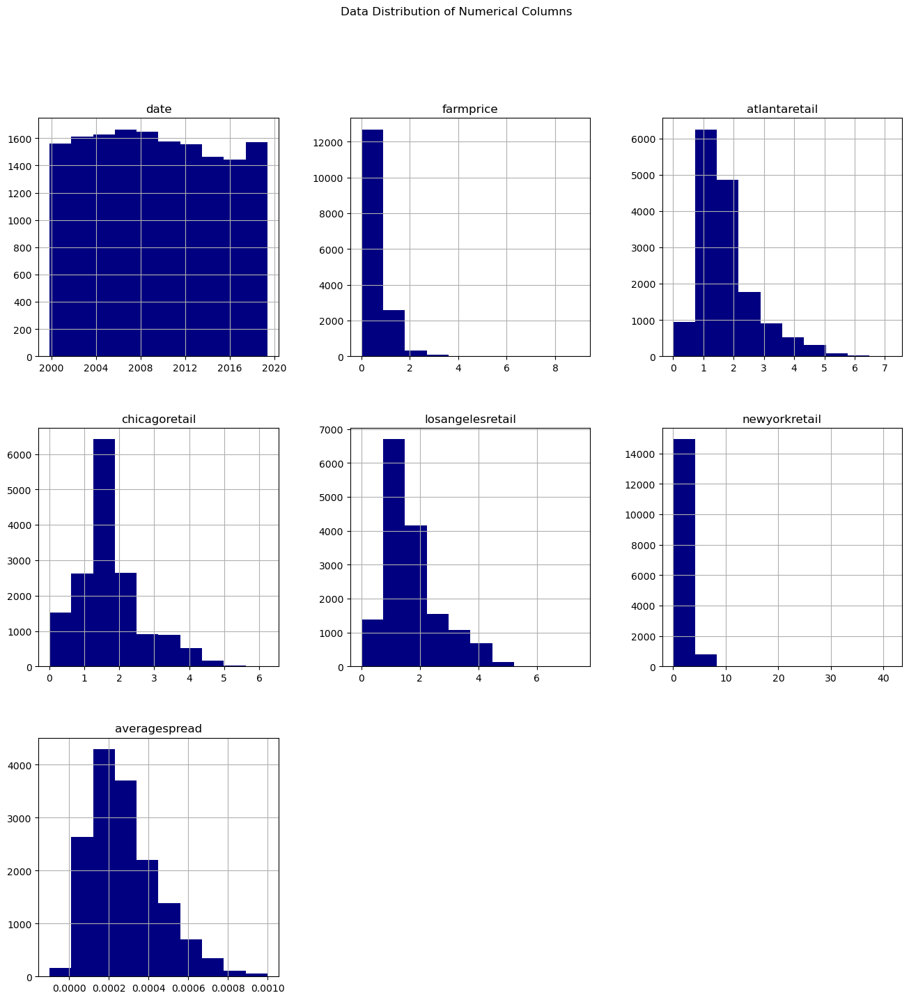

In [49]:
# Visualizing the Numerical Distribution of each Column:
dataset.hist(bins=10, figsize=(16,16), color="navy")
plt.suptitle("Data Distribution of Numerical Columns")
plt.show()

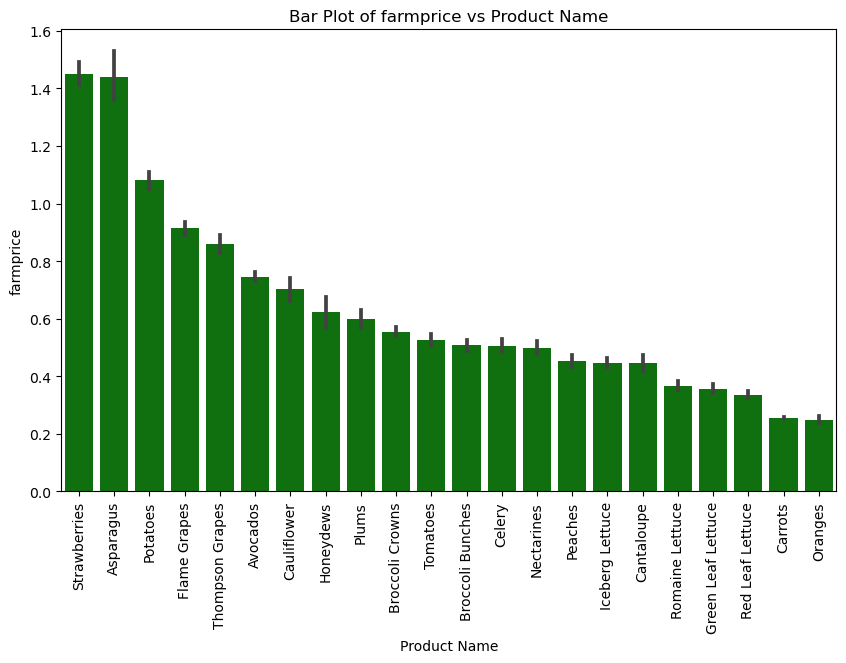

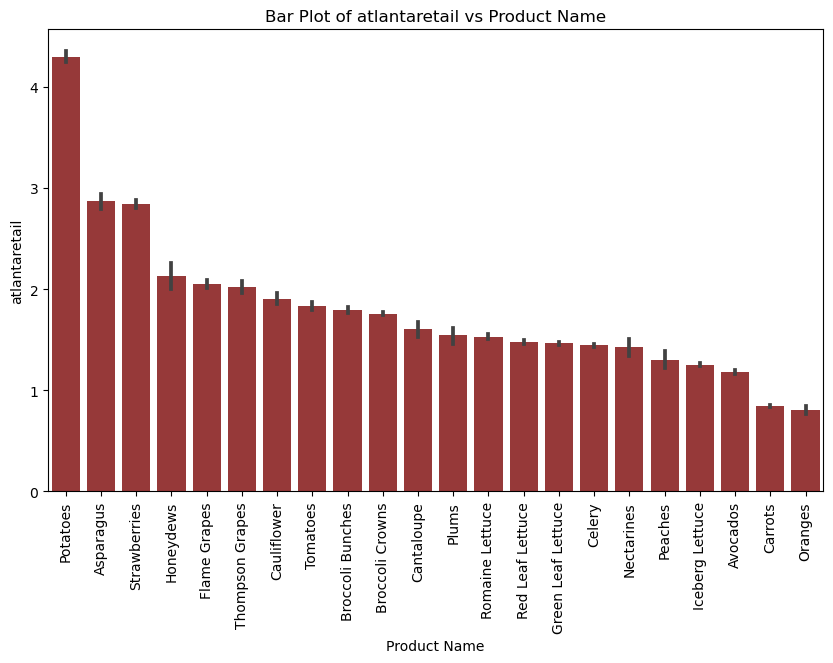

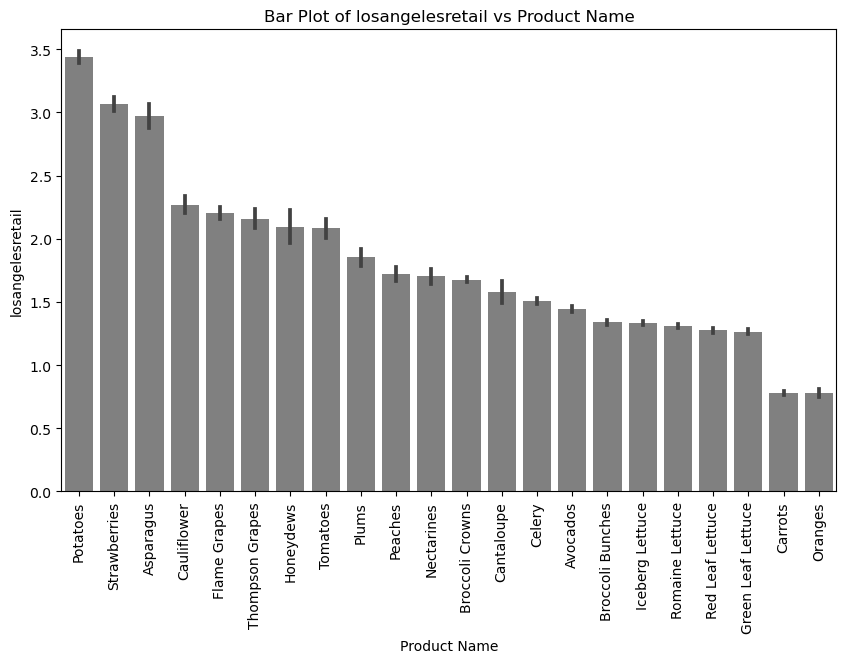

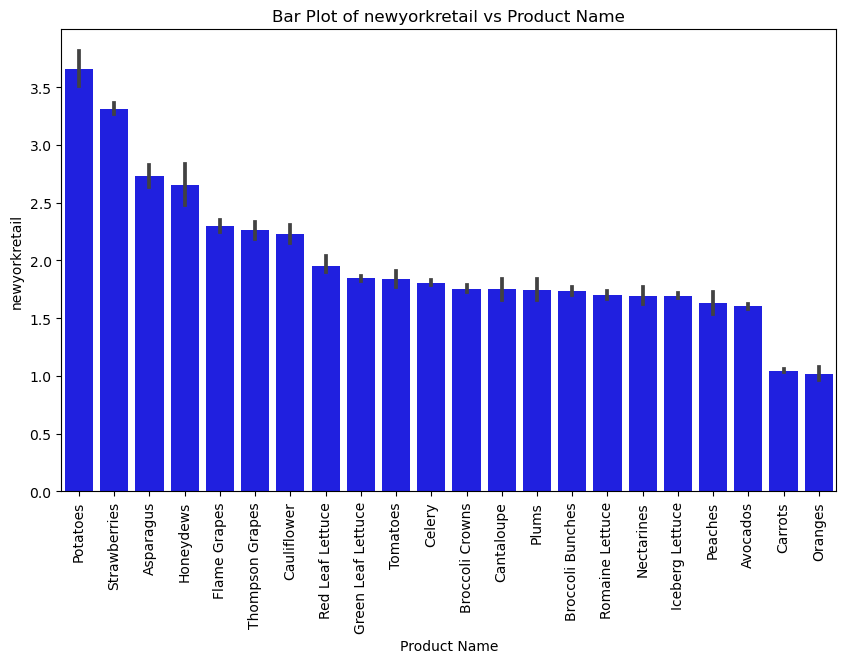

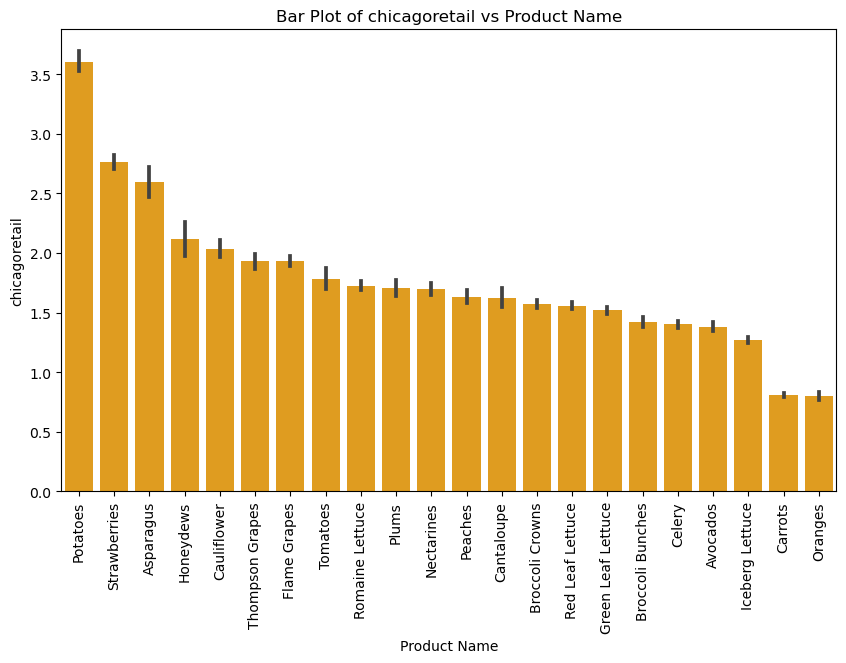

In [28]:
# Analyzing which food item is the most preferred by the people of different cities
column = ['farmprice', 'atlantaretail', 'losangelesretail', 'newyorkretail', 'chicagoretail']
color = ['green', 'brown', 'grey', 'blue', 'orange']

# Calculating average farm price and retail price for each product
avg_farm_price = dataset.groupby('productname')['farmprice'].mean().sort_values(ascending=False).index
avg_atlantaretail = dataset.groupby('productname')['atlantaretail'].mean().sort_values(ascending=False).index
avg_losangelesretail = dataset.groupby('productname')['losangelesretail'].mean().sort_values(ascending=False).index
avg_newyorkretail = dataset.groupby('productname')['newyorkretail'].mean().sort_values(ascending=False).index
avg_chicagoretail = dataset.groupby('productname')['chicagoretail'].mean().sort_values(ascending=False).index

avg_price_list=[avg_farm_price, avg_atlantaretail, avg_losangelesretail, avg_newyorkretail, avg_chicagoretail]

for i in range(len(column)):
    plt.figure(figsize=(10, 6))
    sns.barplot(data=dataset, x='productname', y=column[i], order=avg_price_list[i], color=color[i])
    plt.title(f"Bar Plot of {column[i]} vs Product Name")
    plt.xlabel("Product Name")
    plt.xticks(rotation=90)
    plt.ylabel(column[i])
    plt.show()

The charts above demonstrate that Potatoes, Strawberries, Asparagus, and Cauliflower are the most preferred items among the people of the cities in question, while Carrots and Oranges are the least preferred. 

## Farmprice Change History

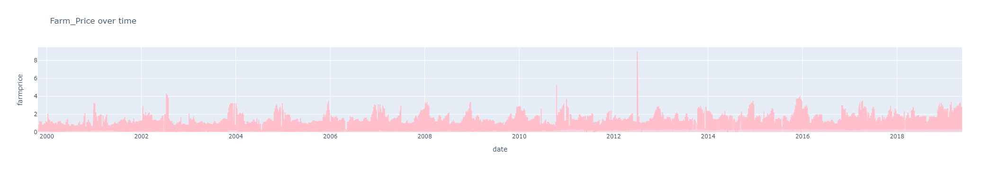

In [39]:
# Analyzing how the farmprice changed over time
fig = px.area(dataset, x="date", y="farmprice", title="Farm_Price over time",color_discrete_sequence=["pink"])
fig.show()

In [30]:
# Finding the Maximum Farm Price and Retail Price for each city
print(f"Max Farmprice($):{dataset['farmprice'].max()}")
print(f"Max Retail Price in Atlanta($) City:{dataset['atlantaretail'].max()}")
print(f"Max Retail Price in Chicago($) City:{dataset['chicagoretail'].max()}")
print(f"Max Retail Price in LosAngels($) City:{dataset['losangelesretail'].max()}")
print(f"Max Retail Price in Newyork($) City:{dataset['newyorkretail'].max()}")

Max Farmprice($):9.0
Max Retail Price in Atlanta($) City:7.21
Max Retail Price in Chicago($) City:6.24
Max Retail Price in LosAngels($) City:7.46
Max Retail Price in Newyork($) City:41.49


The data above allows us to conclude that the most expensive produce is in New York.

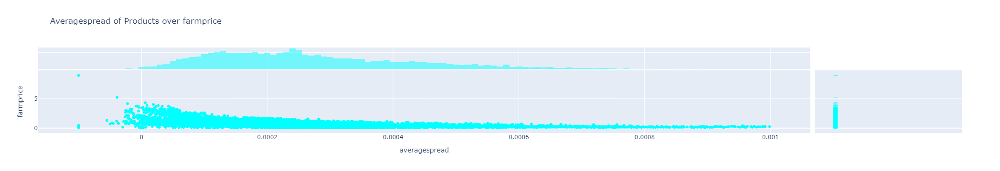

In [41]:
# Visualizing the Average Spread of Products over the Retail and Farm Price
dataset["averagespread"]=(dataset["averagespread"])/100 
fig = px.scatter(dataset, x="averagespread", y="farmprice", title=f"Averagespread of Products over farmprice", color_discrete_sequence=["aqua"],  hover_name="productname",marginal_x="histogram", marginal_y="rug")
fig.show()

Here, we notice that items with higher prices have an average spread ranging from 0-20%, while the average spread of cheaper produce ranges from above 20% to 99%.

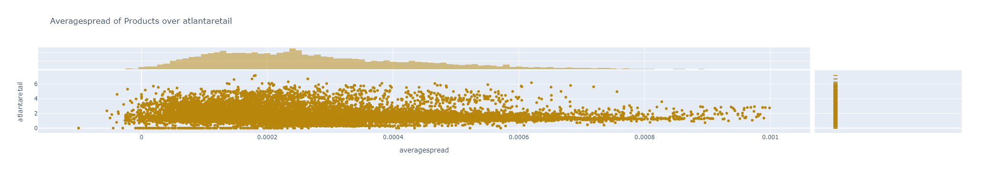

In [43]:
fig = px.scatter(dataset, x="averagespread", y="atlantaretail", title=f"Averagespread of Products over atlantaretail", color_discrete_sequence=["darkgoldenrod"],  hover_name="productname",marginal_x="histogram", marginal_y="rug")
fig.show()

Here, we clearly analyze that the retail prices in Atlanta are higher for most of the products, with a dense average spread rate covering the range from 20% to 80%.

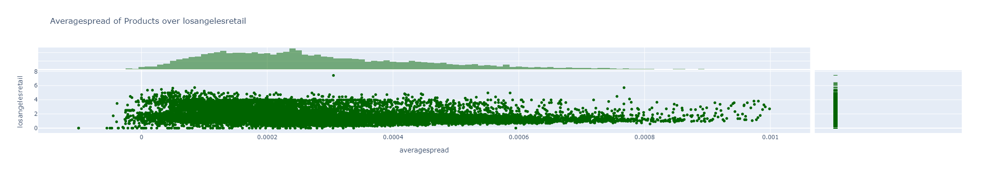

In [44]:
fig = px.scatter(dataset, x="averagespread", y="losangelesretail", title=f"Averagespread of Products over losangelesretail", color_discrete_sequence=["darkgreen"],  hover_name="productname",marginal_x="histogram", marginal_y="rug")
fig.show()

The similar scenario that we noticed in the atlantaretail is here, that is, most of the items are expensive with good averagespread.

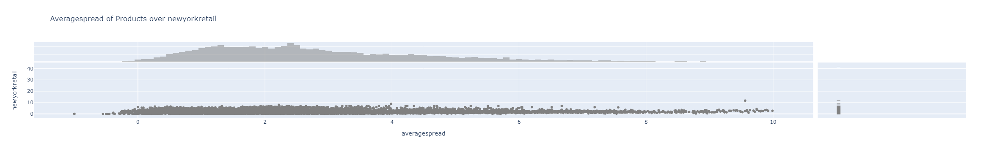

In [34]:
fig = px.scatter(dataset, x="averagespread", y="newyorkretail", title=f"Averagespread of Products over newyorkretail", color_discrete_sequence=["grey"],  hover_name="productname",marginal_x="histogram", marginal_y="rug")
fig.show()

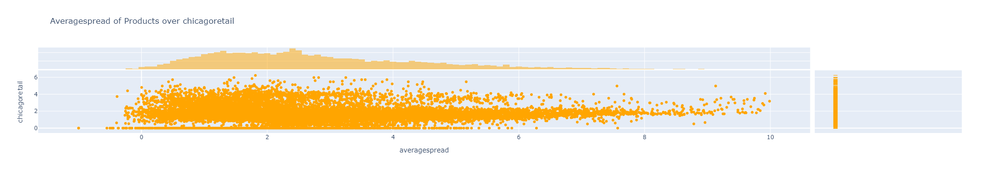

In [38]:
fig = px.scatter(dataset, x="averagespread", y="chicagoretail", title=f"Averagespread of Products over chicagoretail", color_discrete_sequence=["orange"],  hover_name="productname",marginal_x="histogram", marginal_y="rug")
fig.show()

The similar trend we analyzed in Atlanta and Los Angeles cities is found in Chicago, with expensive produce having a dense average spread.

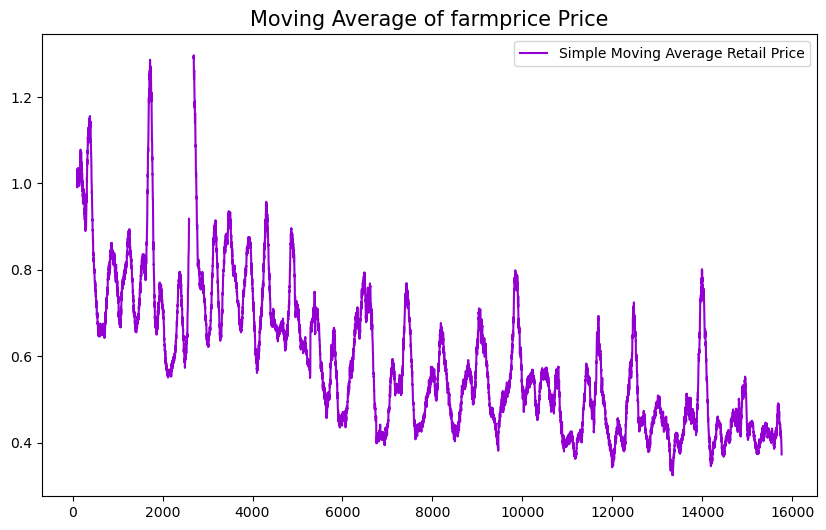

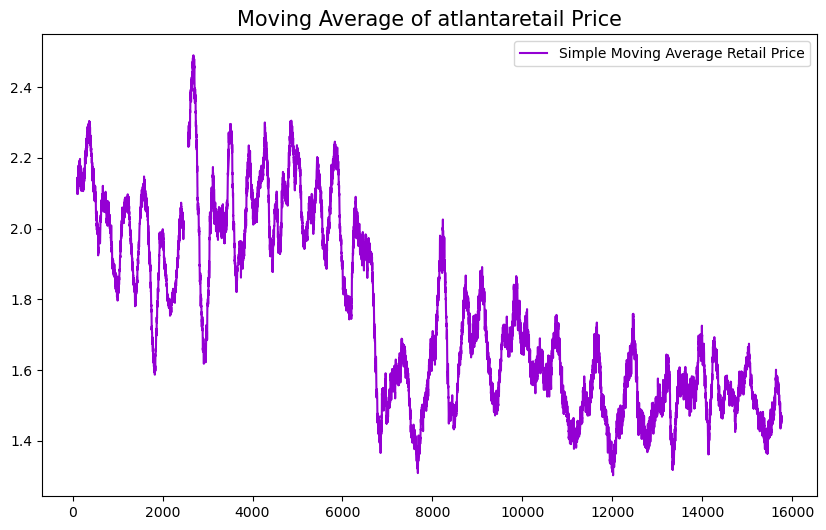

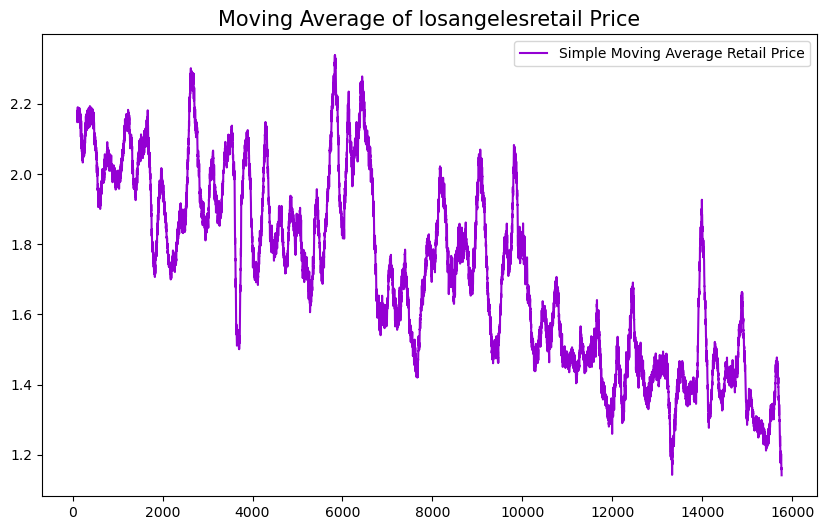

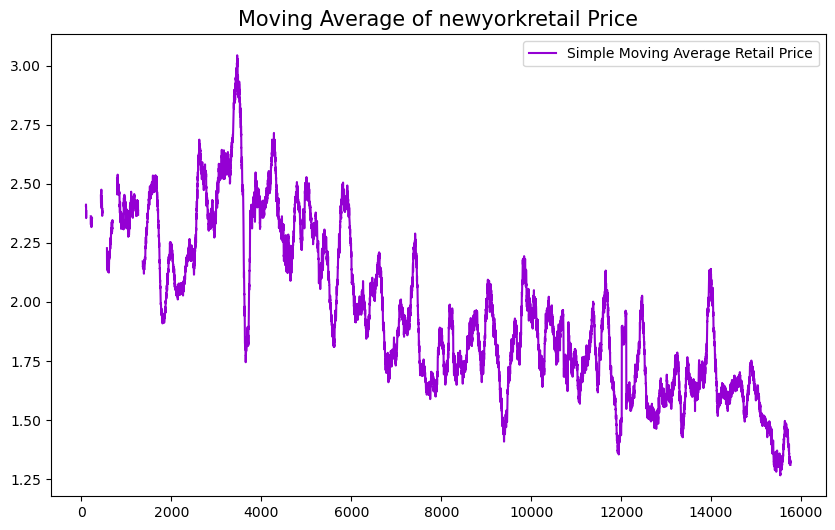

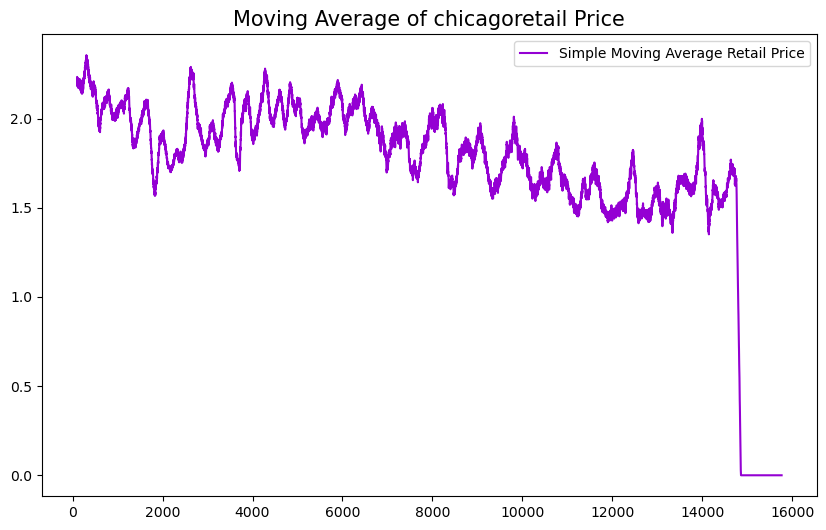

In [45]:
column=['farmprice','atlantaretail','losangelesretail','newyorkretail','chicagoretail']
for col in column:
    simple_moving_average_retail_price =dataset[col].rolling(window=100).mean()
    plt.figure(figsize=(10,6))
    simple_moving_average_retail_price.plot(kind="line",label="Simple Moving Average Retail Price", color="darkviolet")
    plt.xticks(rotation=0)
    plt.title(f"Moving Average of {col} Price", size=15)
    plt.legend()
    plt.show()

Here, we considered the average of the previous 100 values in order to calculate the SMA over the time period.
We can notice that the Retail Price and SMA Retail Price for each city follow each other, which is a sign of an upward trend over time.